<a href="https://colab.research.google.com/github/tommycwong/shift-VAE-atomic/blob/main/shift_VAE_2D_examples.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Install the relevant packages:

The VAE models were developed using pyroVED 0.1.2 and PyTorch 1.8.1 in the Linux environment.

In [ ]:
%%bash
pip install --upgrade torch==1.8.1 torchvision==0.9.1
pip install pyro-ppl==1.6.0
pip install pyroved==0.1.2

pip install atomai
pip install gpim
pip install kornia  # install from the master branch until the next stable release (see https://github.com/kornia/kornia/issues/902) 
git clone https://github.com/ziatdinovmax/AtomicImageSimulator.git

Requirement already up-to-date: torch==1.8.0 in /usr/local/lib/python3.7/dist-packages (1.8.0)
     |████████████████████████████████| 17.3MB 300kB/s 
  Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102


  Cloning https://github.com/kornia/kornia to /tmp/pip-req-build-w59p_ycn
  Running command git clone -q https://github.com/kornia/kornia /tmp/pip-req-build-w59p_ycn
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for kornia: filename=kornia-0.5.4+5f9b06b-cp37-none-any.whl size=285931 sha256=41b346aed2a8ed9db1d46a1c8d223b9a7789400dd99a28afe4e6d964e7e94edc
  Stored in directory: /tmp/pip-ephem-wheel-cache-vbeh9n1z/wheels/5f/8b/92/375714dc479253f78ed777dd105d79f9693448dcfef85c8163
Successfully built kornia
Cloning into 'AtomicImageSimulator'...
remote: Enumerating objects: 89, done.
remote: Total 89 (delta 0), reused 0 (delta 0), pack-reused 89
Unpacking objects: 100% (89/89), done.
/content/AtomicImageSimulator/AtomicImageSimulator


Change into the directory of AtomicImageSimulator:

In [ ]:
%cd AtomicImageSimulator/

Import modules:

In [ ]:
from main import *
import matplotlib.pyplot as plt
import seaborn as sns
import kornia as K
import numpy as np
import torch
import torch.nn as nn
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pyroved as pv
import cv2
import os
import h5py
import atomai as aoi
from scipy import fftpack
import gpim

tt = torch.tensor

/usr/local/lib/python3.7/dist-packages/kornia/augmentation/augmentation.py:1861: DeprecationWarning: GaussianBlur is no longer maintained and will be removed from the future versions. Please use RandomGaussianBlur instead.
  category=DeprecationWarning,
/usr/local/lib/python3.7/dist-packages/progressbar/bar.py:50: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  class ProgressBarBase(collections.Iterable, ProgressBarMixinBase):


Set font sizes for figures:

In [ ]:
# set plot font sizes
SMALL_SIZE = 20
MEDIUM_SIZE = 25
BIGGER_SIZE = 30

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

## VAE on synthetic atomic resolution image (Fig. 4)

Download file and choose synthetic lattice to simulate:

In [ ]:
!gdown https://drive.google.com/uc?id=17-ke6Mze5GhlRsUfUSm19Jaz5b46Iaq7
lattice_coordinates = np.load('Square-coordinates-clean.npy')

Downloading...
From: https://drive.google.com/uc?id=17-ke6Mze5GhlRsUfUSm19Jaz5b46Iaq7
To: /content/AtomicImageSimulator/Square-coordinates-clean.npy
5.58MB [00:00, 49.2MB/s]


Specify parameters for image simulation:

In [ ]:
# nearest neighbor (nn) distance
nnd = 1.5
# angstrom to pixel conversion coefficient (do not change)
ang2px = 12
# angle to rotate (min, max, step)
ang = (0, 1, 1)
# list atom "widths" (better to keep it below 15)
sc = [13] 
# number of holes to be introduced
n_holes = 0
# size of the largest hole (in the nn distance units)
r_hole = 5
# random displacement of atomic poision (0 to 1)
randomize = 0.01
# blurring due to overlap with a probe
convprobe = 1.5

Simulate an image:

In [ ]:
sl = SimulateLattice(
    lattice_coordinates, ang2px, ang, sc, nnd,
    randomize, convprobe, n_holes, r_hole)
imgsrc, _ = sl.make_image()

Plot a result (Fig. 4 (a)):

(-0.5, 99.5, 99.5, -0.5)

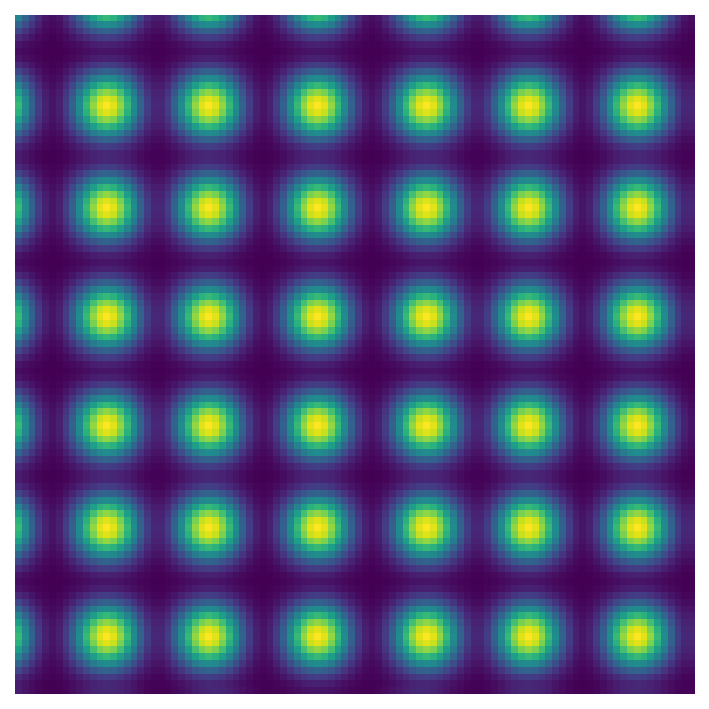

In [ ]:
subimg = imgsrc[200:300, 200:300]  # we can do this based on atomic coordinates, etc.

plt.figure(figsize=(6, 6), dpi=150)
plt.imshow(subimg)
plt.axis('off')

Central crop after affine trasnforms:

In [ ]:
torch.manual_seed(42) # for reproducibility

crop_size = (64, 64)

transform = nn.Sequential(
        K.augmentation.RandomAffine(
            2, translate= [.05, .05], shear=[-1, 1, -1, 1], p=1, return_transform=True),
        K.augmentation.CenterCrop(crop_size)
)


n_samples = 6000
images_transformed, ground_truth = transform(
    tt(subimg[None, None]).repeat_interleave(n_samples, 0))

Initialize dataloader:

In [ ]:
images_transformed = (images_transformed - images_transformed.min()) / (images_transformed.max() - images_transformed.min())
images_transformed = images_transformed.float()
train_loader = pv.utils.init_dataloader(images_transformed, batch_size=64)

In [ ]:
t1_real = []
t2_real = []
a12_real = []

for i in range(images_transformed.shape[0]):
    t1, t2, a12 = ground_truth[i,0,2], ground_truth[i,1,2], ground_truth[i,0,1]
    t1_real.append(t1)
    t2_real.append(t2)
    a12_real.append(a12)

t1_real = np.array(t1_real)
t2_real = np.array(t2_real)
a12_real = np.array(a12_real)

Display transformed images (Fig. 4 (b)):

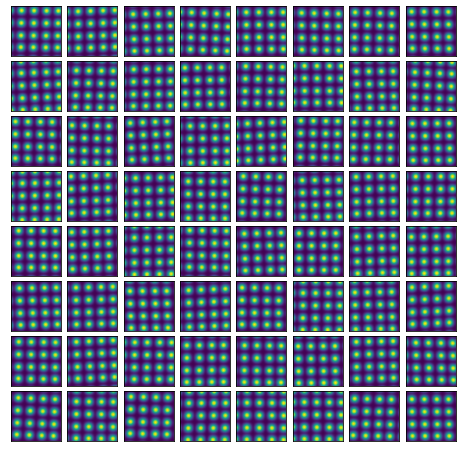

In [ ]:
fig, axes = plt.subplots(8, 8, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax, (y,) in zip(axes.flat, train_loader):
    ax.imshow(y[0, 0])

### Train a regular VAE (Fig. 4 (c) & (d))

In [ ]:
in_dim = (64,64)

# Initialize vanilla VAE
vae = pv.models.trVAE(in_dim, latent_dim=2, coord=0, seed=0)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
for e in range(200):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: 2281.8956
Epoch: 2 Training loss: 1875.1645
Epoch: 3 Training loss: 1760.1759
Epoch: 4 Training loss: 1736.8417
Epoch: 5 Training loss: 1728.6879
Epoch: 6 Training loss: 1724.9471
Epoch: 7 Training loss: 1721.9846
Epoch: 8 Training loss: 1720.2793
Epoch: 9 Training loss: 1719.1048
Epoch: 10 Training loss: 1718.7045
Epoch: 11 Training loss: 1717.6185
Epoch: 12 Training loss: 1717.2248
Epoch: 13 Training loss: 1717.7463
Epoch: 14 Training loss: 1716.5744
Epoch: 15 Training loss: 1715.8699
Epoch: 16 Training loss: 1715.9286
Epoch: 17 Training loss: 1716.2067
Epoch: 18 Training loss: 1715.6834
Epoch: 19 Training loss: 1715.3750
Epoch: 20 Training loss: 1715.7589
Epoch: 21 Training loss: 1714.7246
Epoch: 22 Training loss: 1714.7927
Epoch: 23 Training loss: 1714.7855
Epoch: 24 Training loss: 1714.8712
Epoch: 25 Training loss: 1715.3081
Epoch: 26 Training loss: 1714.5094
Epoch: 27 Training loss: 1714.7507
Epoch: 28 Training loss: 1714.4739
Epoch: 29 Training loss: 1714

Plot the learned manifold:

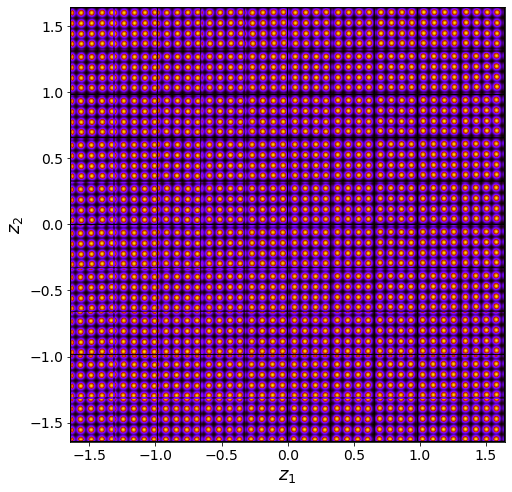

In [ ]:
vae.manifold2d(d=10);

Encode the training data into the latent space and plot the results:

Text(0, 0.5, '[arb. unit]')

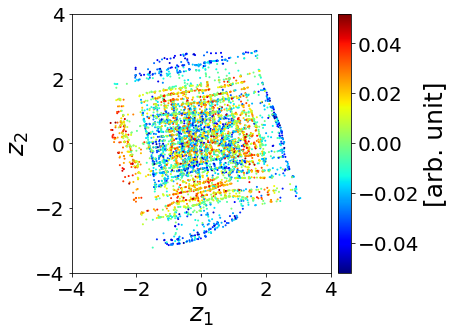

In [ ]:
z_mean, z_sd = vae.encode(images_transformed.float())

fig, ax = plt.subplots(figsize=(5, 5))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
c = ax.scatter(z_mean[:, 0], z_mean[:, 1], c = a12_real, s=1, cmap = 'jet')
fig.colorbar(c, cax=cax)
ax.set_aspect('equal')
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
ax.set_xlabel('$z_1$')
ax.set_ylabel('$z_2$')
cax.set_ylabel('[arb. unit]')

### Train a shift-VAE (Fig. 4 (e) & (f))

In [ ]:
in_dim = (64,64)

# Initialize shift-invariant VAE
vae = pv.models.trVAE(in_dim, latent_dim=2, coord=2, dx_prior=0.5, dy_prior=0.5, seed=0)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
kl_scale = torch.linspace(.5, 4, 150)
for e in range(200):
    sc = kl_scale[e] if e < len(kl_scale) else kl_scale[-1] 
    trainer.step(train_loader, scale_factor=sc)
    trainer.print_statistics()

Epoch: 1 Training loss: 2402.7607
Epoch: 2 Training loss: 2387.1823
Epoch: 3 Training loss: 2385.3323
Epoch: 4 Training loss: 2384.3040
Epoch: 5 Training loss: 2383.6243
Epoch: 6 Training loss: 2382.2487
Epoch: 7 Training loss: 2378.5998
Epoch: 8 Training loss: 2367.9612
Epoch: 9 Training loss: 2329.4862
Epoch: 10 Training loss: 2255.2426
Epoch: 11 Training loss: 2192.0735
Epoch: 12 Training loss: 2112.3151
Epoch: 13 Training loss: 2046.0341
Epoch: 14 Training loss: 2006.1629
Epoch: 15 Training loss: 1960.2851
Epoch: 16 Training loss: 1935.1426
Epoch: 17 Training loss: 1888.5939
Epoch: 18 Training loss: 1857.1294
Epoch: 19 Training loss: 1842.1569
Epoch: 20 Training loss: 1837.1526
Epoch: 21 Training loss: 1822.6788
Epoch: 22 Training loss: 1814.4613
Epoch: 23 Training loss: 1806.2551
Epoch: 24 Training loss: 1793.4308
Epoch: 25 Training loss: 1792.8826
Epoch: 26 Training loss: 1782.1474
Epoch: 27 Training loss: 1779.3321
Epoch: 28 Training loss: 1780.3259
Epoch: 29 Training loss: 1778

Plot the learned manifold:

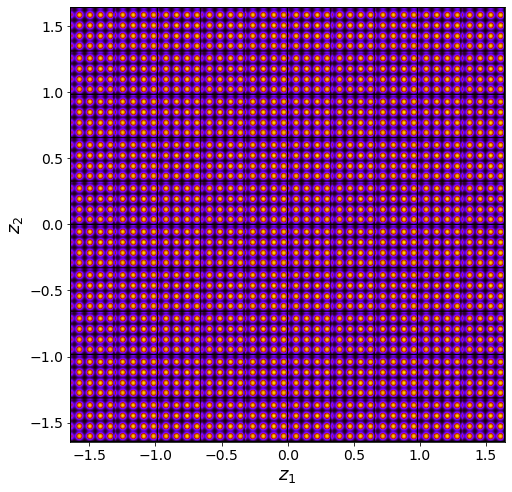

In [ ]:
vae.manifold2d(d=10);

Encode the training data into the latent space and plot the results:

Text(0, 0.5, '[arb. unit]')

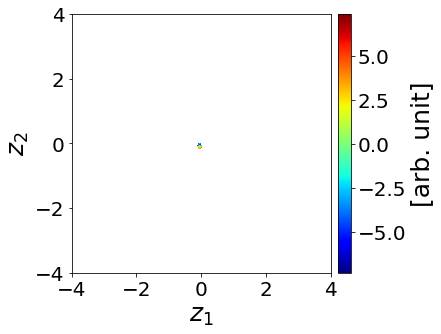

In [ ]:
z_mean, z_sd = vae.encode(images_transformed.float())

fig, ax = plt.subplots(figsize=(5, 5))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
c = ax.scatter(z_mean[:, -1], z_mean[:, -2], c = t1_real, s=1, cmap = 'jet')
fig.colorbar(c, cax=cax)
ax.set_aspect('equal')
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
ax.set_xlabel('$z_1$')
ax.set_ylabel('$z_2$')
cax.set_ylabel('[arb. unit]')

## VAE on experimental images (Fig.s 5–7)

### Graphene

Download and show the image (Fig. 5 (a)):

Downloading...
From: https://drive.google.com/uc?id=1XyvzQheVVJtUQDwCVGfD7-U-6XmFzzJj
To: /content/AtomicImageSimulator/graphene_oxide_reduced.tif
100% 1.67M/1.67M [00:00<00:00, 50.1MB/s]


(-0.5, 914.5, 914.5, -0.5)

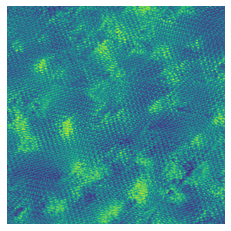

In [ ]:
!gdown https://drive.google.com/uc?id=1XyvzQheVVJtUQDwCVGfD7-U-6XmFzzJj
graphene4 = cv2.imread("graphene_oxide_reduced.tif", 0)
plt.imshow(graphene4)
plt.axis('off')

Crop the image into patches:

In [ ]:
window_size = 48 
step_size = 8 

work_image = graphene4 #temp
d1 = int((work_image.shape[0]-window_size/2)/step_size- 2)
d2 = int((work_image.shape[1]-window_size/2)/step_size- 2)

coordinates = aoi.utils.get_coord_grid(work_image, step_size)
imstack_grid, com_grid, frames_grid = aoi.utils.extract_subimages(work_image, coordinates, window_size)

Initialize data loader:

In [ ]:
imstack_grid = (imstack_grid - imstack_grid.min()) / (imstack_grid.max() - imstack_grid.min())

for i, el in enumerate(imstack_grid):
  imstack_grid[i] = (el - el.min()) / (el.max() - el.min())

train_data = torch.tensor(imstack_grid[:,:,:,0]).float()
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), batch_size=64)

#### Train a regular VAE (Fig. 6 (a))

In [ ]:
in_dim = (window_size,window_size)

# Initialize vanilla VAE
vae = pv.models.trVAE(in_dim, latent_dim=2, coord=0, seed=0)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
for e in range(200):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: 1589.9107
Epoch: 2 Training loss: 1589.2366
Epoch: 3 Training loss: 1589.1951
Epoch: 4 Training loss: 1589.2536
Epoch: 5 Training loss: 1589.1289
Epoch: 6 Training loss: 1589.0783
Epoch: 7 Training loss: 1589.0110
Epoch: 8 Training loss: 1589.0309
Epoch: 9 Training loss: 1588.9759
Epoch: 10 Training loss: 1588.9965
Epoch: 11 Training loss: 1588.9791
Epoch: 12 Training loss: 1588.9340
Epoch: 13 Training loss: 1588.9458
Epoch: 14 Training loss: 1585.3590
Epoch: 15 Training loss: 1580.4313
Epoch: 16 Training loss: 1578.9237
Epoch: 17 Training loss: 1577.4954
Epoch: 18 Training loss: 1576.9440
Epoch: 19 Training loss: 1575.8546
Epoch: 20 Training loss: 1575.2509
Epoch: 21 Training loss: 1572.1441
Epoch: 22 Training loss: 1569.5122
Epoch: 23 Training loss: 1568.6091
Epoch: 24 Training loss: 1565.4191
Epoch: 25 Training loss: 1564.4767
Epoch: 26 Training loss: 1563.5618
Epoch: 27 Training loss: 1563.0781
Epoch: 28 Training loss: 1562.8219
Epoch: 29 Training loss: 1562

Plot the learned manifold:


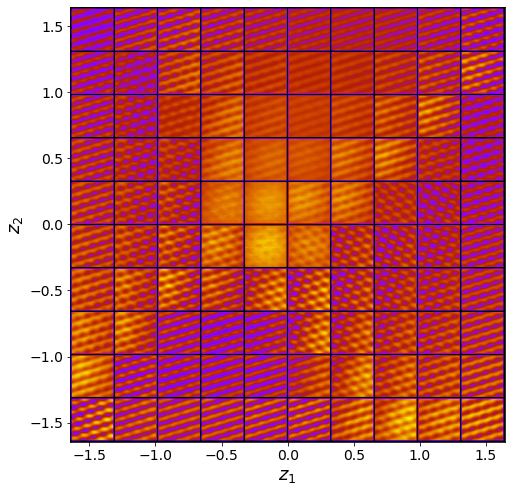

In [ ]:
vae.manifold2d(d=10);

Encode and plot the latent space representations:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, '$z_2$')

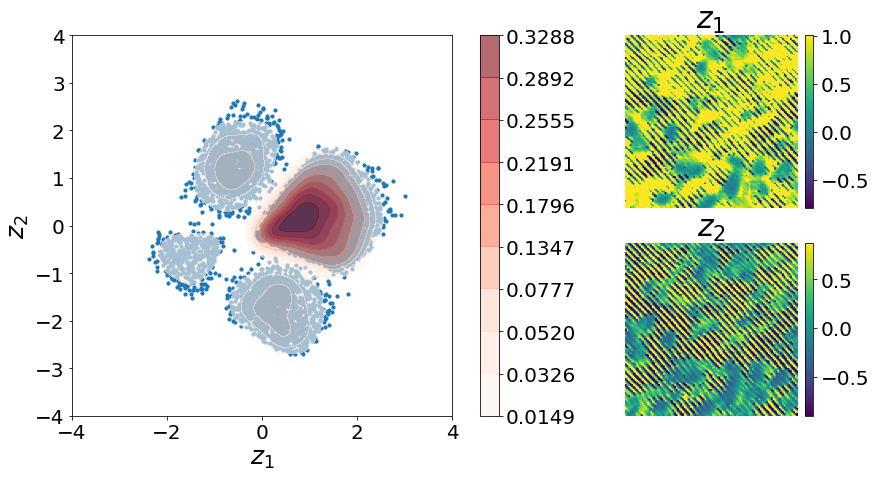

In [ ]:
z_mean, z_sd = vae.encode(train_data)

fig = plt.figure(constrained_layout=False, figsize=(15, 7))
gs = fig.add_gridspec(2, 3, wspace=.1)

ax1 = fig.add_subplot(gs[:, :2])
ax1.scatter(z_mean[:, -2], z_mean[:, -1], s=10, alpha=.3)
ax1 = sns.kdeplot(z_mean[:, -2], z_mean[:, -1], cmap="Reds", shade=True, 
                  shade_lowest=False, cut=0, alpha=.6, cbar=True)
ax1.set_aspect('equal', 'box')
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_xlabel('$z_1$')
ax1.set_ylabel('$z_2$')


ax2 = fig.add_subplot(gs[0, 2])
z1_img = z_mean[:, 0]
z1ax = ax2.imshow(z1_img.reshape(d1,d2), vmin=z1_img.min()/3, vmax=z1_img.max()/3)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.1)
cbar2 = fig.colorbar(z1ax, cax=cax2)
ax2.axis('off')
ax2.set_title('$z_1$')

ax3 = fig.add_subplot(gs[1, 2])
z2_img = z_mean[:, 1]
z2ax = ax3.imshow(z2_img.reshape(d1,d2), vmin=z2_img.min()/3, vmax=z2_img.max()/3)
divider = make_axes_locatable(ax3)
cax3 = divider.append_axes("right", size="5%", pad=0.1)
cbar3 = fig.colorbar(z2ax, cax=cax3)
ax3.axis('off')
ax3.set_title('$z_2$')

#### Train a shift-VAE (Fig. 7 (a))

In [ ]:
in_dim = (window_size,window_size)

# Initialize shift-invariant VAE
sh_vae = pv.models.trVAE(in_dim, latent_dim=2, coord=2, seed=4, dx_prior=0.5, dy_prior=0.5)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(sh_vae)

# Train for n epochs:
kl_scale = torch.linspace(.01, .5, 150)
for e in range(200):
    sc = kl_scale[e] if e < len(kl_scale) else kl_scale[-1] 
    trainer.step(train_loader, scale_factor=sc)
    trainer.print_statistics()

Epoch: 1 Training loss: 1588.0046
Epoch: 2 Training loss: 1582.3352
Epoch: 3 Training loss: 1580.2388
Epoch: 4 Training loss: 1577.1141
Epoch: 5 Training loss: 1575.4981
Epoch: 6 Training loss: 1572.4876
Epoch: 7 Training loss: 1571.8130
Epoch: 8 Training loss: 1568.9671
Epoch: 9 Training loss: 1567.4087
Epoch: 10 Training loss: 1564.6768
Epoch: 11 Training loss: 1561.0754
Epoch: 12 Training loss: 1559.8062
Epoch: 13 Training loss: 1558.2983
Epoch: 14 Training loss: 1557.1937
Epoch: 15 Training loss: 1556.4894
Epoch: 16 Training loss: 1557.4566
Epoch: 17 Training loss: 1556.2505
Epoch: 18 Training loss: 1555.0583
Epoch: 19 Training loss: 1554.9184
Epoch: 20 Training loss: 1555.5022
Epoch: 21 Training loss: 1554.4772
Epoch: 22 Training loss: 1554.6596
Epoch: 23 Training loss: 1554.9976
Epoch: 24 Training loss: 1554.5191
Epoch: 25 Training loss: 1554.4052
Epoch: 26 Training loss: 1554.1660
Epoch: 27 Training loss: 1554.3998
Epoch: 28 Training loss: 1554.1484
Epoch: 29 Training loss: 1554

Plot the learned manifold:


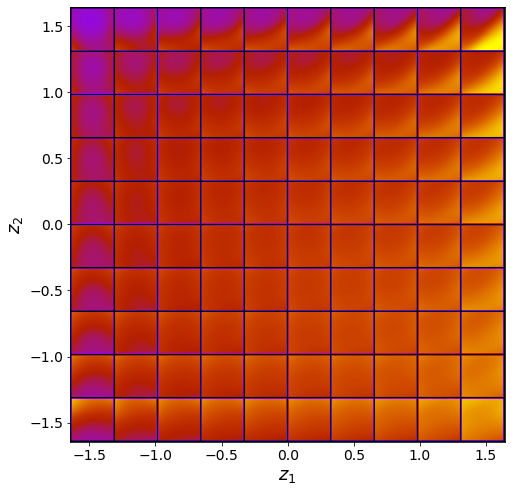

In [ ]:
sh_vae.manifold2d(d=10);

Encode and plot the latent space representations:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, '$z_2$')

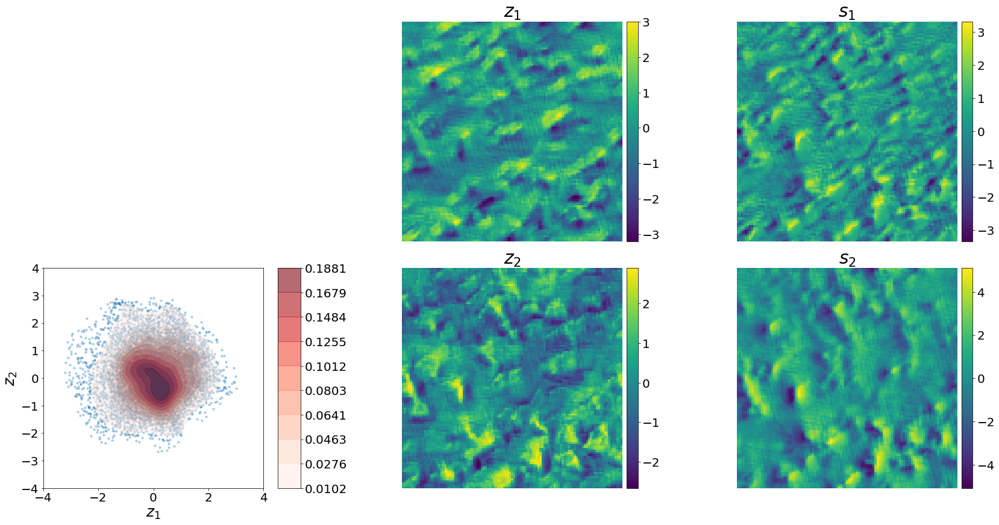

In [ ]:
z_mean, z_sd = sh_vae.encode(train_data)


fig = plt.figure(constrained_layout=True, figsize=(25, 12))
gs = fig.add_gridspec(2, 3)

ax1 = fig.add_subplot(gs[1, 0])
ax1.scatter(z_mean[:, -2], z_mean[:, -1], s=10, alpha=.3)
ax1 = sns.kdeplot(z_mean[:, -2], z_mean[:, -1], cmap="Reds", shade=True, shade_lowest=False, cut=0, alpha=0.6, cbar=True)
ax1.set_aspect('equal', 'box')
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_xlabel('$z_1$')
ax1.set_ylabel('$z_2$')

ax2 = fig.add_subplot(gs[0, 2])
z_img = z_mean[:, 0].reshape(d1,d2)
z = ax2.imshow(z_img)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.1)
cbar2 = fig.colorbar(z, cax=cax2)
ax2.axis('off')
ax2.set_title('$s_1$')

ax3 = fig.add_subplot(gs[1, 2])
z_img = z_mean[:, 1].reshape(d1,d2)
z = ax3.imshow(z_img)
divider = make_axes_locatable(ax3)
cax3 = divider.append_axes("right", size="5%", pad=0.1)
cbar3 = fig.colorbar(z, cax=cax3)
ax3.axis('off')
ax3.set_title('$s_2$')

ax4 = fig.add_subplot(gs[0, 1])
z_img = z_mean[:, 2].reshape(d1,d2)
z = ax4.imshow(z_img)
divider = make_axes_locatable(ax4)
cax4 = divider.append_axes("right", size="5%", pad=0.1)
cbar4 = fig.colorbar(z, cax=cax4)
ax4.axis('off')
ax4.set_title('$z_1$')

ax5 = fig.add_subplot(gs[1, 1])
z_img = z_mean[:, 3].reshape(d1,d2)
z = ax5.imshow(z_img)
divider = make_axes_locatable(ax5)
cax5 = divider.append_axes("right", size="5%", pad=0.1)
cbar5 = fig.colorbar(z, cax=cax5)
ax5.axis('off')
ax5.set_title('$z_2$')

### BiFeO$_{3}$

Download and show the image (Fig. 5 (b)):

Downloading...
From: https://drive.google.com/uc?id=1o_Sj5Z8ZXkPKDy_q9mmc8QfbdG77vWOK
To: /content/AtomicImageSimulator/aligned-03_site7_55_56_HAADF.h5
145MB [00:00, 178MB/s]


(-0.5, 3899.5, -0.5, 3899.5)

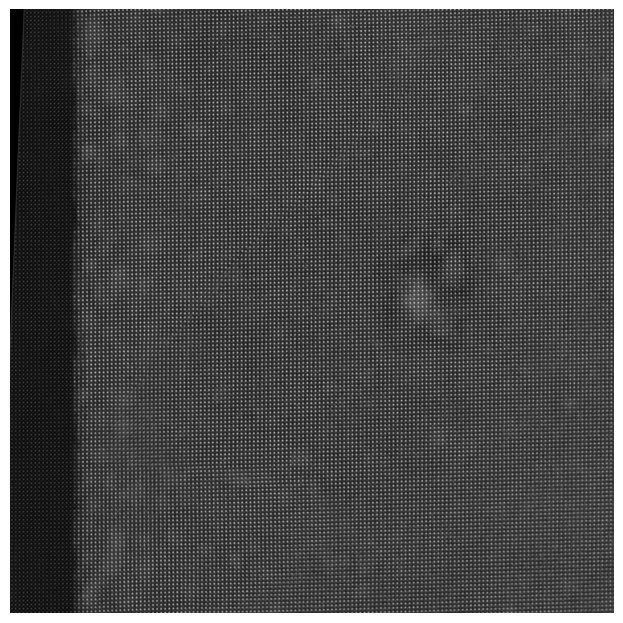

In [ ]:
!gdown https://drive.google.com/uc?id=1o_Sj5Z8ZXkPKDy_q9mmc8QfbdG77vWOK
imgdata = []

temp = h5py.File('aligned-03_site7_55_56_HAADF.h5', 'r')['MainImage']
imgdata.append(temp)
temp = temp[200:4100, 100:4000]
  
fig = plt.figure(figsize=(8, 8), dpi=100)
plt.imshow(temp, origin='bottom', cmap='gray')
plt.axis('off')

Download a saved semantic segmentation model and apply it the data:

In [ ]:
!gdown https://drive.google.com/uc?id=18k3cd3bH2_7XaoOgiZTK0rPo_sAMG18Y

segmentor = aoi.load_model("simple_segmentor.tar")
temp_seg = segmentor.predict(temp, compute_coords=False, num_batches=100)

Downloading...
From: https://drive.google.com/uc?id=18k3cd3bH2_7XaoOgiZTK0rPo_sAMG18Y
To: /content/AtomicImageSimulator/simple_segmentor.tar
2.42MB [00:00, 77.6MB/s]
Batch 1/1

Crop the image into patches:

In [ ]:
window_size = 48
step_size = 8 

work_image = temp_seg[0,:,:,0]
d1 = int((work_image.shape[0]-window_size/2)/step_size- 2)
d2 = int((work_image.shape[1]-window_size/2)/step_size- 2)

coordinates = aoi.utils.get_coord_grid(work_image, step_size)
imstack_grid, com_grid, frames_grid = aoi.utils.extract_subimages(work_image, coordinates, window_size)

Initialize data loader:

In [ ]:
imstack_grid = (imstack_grid - imstack_grid.min()) / (imstack_grid.max() - imstack_grid.min())
train_data = torch.tensor(imstack_grid[:,:,:,0]).float()
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), batch_size=64)

#### Train a regular VAE (Fig. 6 (b))

In [ ]:
in_dim = (window_size,window_size)

# Initialize vanilla VAE
vae = pv.models.trVAE(in_dim, latent_dim=2, coord=0, seed=0)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
for e in range(50):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: 402.6224
Epoch: 2 Training loss: 326.4060
Epoch: 3 Training loss: 321.8033
Epoch: 4 Training loss: 319.6425
Epoch: 5 Training loss: 317.3965
Epoch: 6 Training loss: 316.5894
Epoch: 7 Training loss: 316.7422
Epoch: 8 Training loss: 316.0772
Epoch: 9 Training loss: 318.4587
Epoch: 10 Training loss: 317.2564
Epoch: 11 Training loss: 316.5919
Epoch: 12 Training loss: 317.5095
Epoch: 13 Training loss: 317.3307
Epoch: 14 Training loss: 316.3135
Epoch: 15 Training loss: 315.9792
Epoch: 16 Training loss: 315.4891
Epoch: 17 Training loss: 315.7423
Epoch: 18 Training loss: 315.9973
Epoch: 19 Training loss: 315.6315
Epoch: 20 Training loss: 315.4621
Epoch: 21 Training loss: 315.6104
Epoch: 22 Training loss: 315.3166
Epoch: 23 Training loss: 315.4657
Epoch: 24 Training loss: 315.4086
Epoch: 25 Training loss: 315.0548
Epoch: 26 Training loss: 314.4001
Epoch: 27 Training loss: 314.2508
Epoch: 28 Training loss: 314.4351
Epoch: 29 Training loss: 315.1471
Epoch: 30 Training loss

Plot the learned manifold:


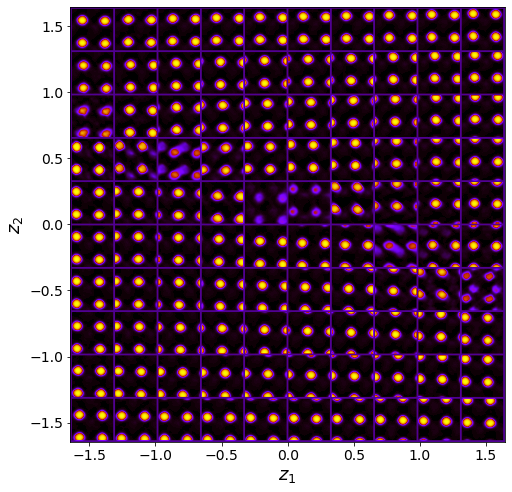

In [ ]:
vae.manifold2d(d=10, pad_value=.1);

Encode and plot the latent space representations:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, '$z_2$')

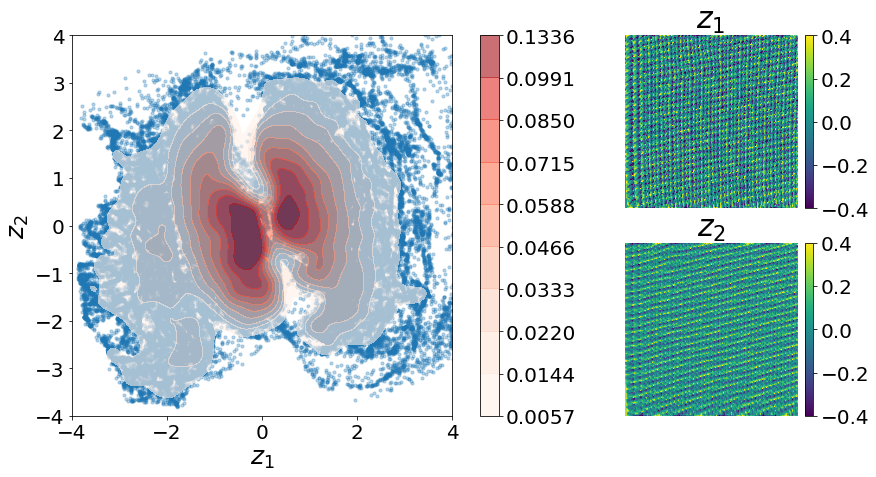

In [ ]:
z_mean, z_sd = vae.encode(train_data)

fig = plt.figure(constrained_layout=False, figsize=(15, 7))
gs = fig.add_gridspec(2, 3, wspace=.1)

ax1 = fig.add_subplot(gs[:, :2])
ax1.scatter(z_mean[:, -2], z_mean[:, -1], s=10, alpha=.3)
ax1 = sns.kdeplot(z_mean[:, -2], z_mean[:, -1], cmap="Reds", shade=True, 
                  shade_lowest=False, cut=0, alpha=.6, cbar=True)
ax1.set_aspect('equal', 'box')
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_xlabel('$z_1$')
ax1.set_ylabel('$z_2$')

ax2 = fig.add_subplot(gs[0, 2])
z1_img = z_mean[:, 0]
z1ax = ax2.imshow(z1_img.reshape(d1, d2), vmin=-.4, vmax=.4)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.1)
cbar2 = fig.colorbar(z1ax, cax=cax2)
ax2.axis('off')
ax2.set_title('$z_1$')

ax3 = fig.add_subplot(gs[1, 2])
z2_img = z_mean[:, 1]
z2ax = ax3.imshow(z2_img.reshape(d1,d2), vmin=-.4, vmax=.4)
divider = make_axes_locatable(ax3)
cax3 = divider.append_axes("right", size="5%", pad=0.1)
cbar3 = fig.colorbar(z2ax, cax=cax3)
ax3.axis('off')
ax3.set_title('$z_2$')

#### Train a shift-VAE (Fig. 7 (b))

In [ ]:
in_dim = (window_size,window_size)

# Initialize shift-invariant VAE
sh_vae = pv.models.trVAE(in_dim, latent_dim=2, coord=2, seed=1, dx_prior=0.5, dy_prior=0.5)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(sh_vae)

# Train for n epochs:
kl_scale = torch.linspace(0.1, 1, 50)
for e in range(50):
    sc = kl_scale[e] if e < len(kl_scale) else kl_scale[-1] 
    trainer.step(train_loader, scale_factor=sc)
    trainer.print_statistics()

Epoch: 1 Training loss: 490.0161
Epoch: 2 Training loss: 318.0870
Epoch: 3 Training loss: 310.2843
Epoch: 4 Training loss: 306.6072
Epoch: 5 Training loss: 303.4329
Epoch: 6 Training loss: 302.3207
Epoch: 7 Training loss: 302.2411
Epoch: 8 Training loss: 301.5057
Epoch: 9 Training loss: 301.8820
Epoch: 10 Training loss: 301.4042
Epoch: 11 Training loss: 301.4394
Epoch: 12 Training loss: 301.7531
Epoch: 13 Training loss: 301.5102
Epoch: 14 Training loss: 301.0703
Epoch: 15 Training loss: 301.0569
Epoch: 16 Training loss: 301.0614
Epoch: 17 Training loss: 301.2324
Epoch: 18 Training loss: 301.3944
Epoch: 19 Training loss: 301.4642
Epoch: 20 Training loss: 301.7537
Epoch: 21 Training loss: 301.7123
Epoch: 22 Training loss: 301.8026
Epoch: 23 Training loss: 302.0165
Epoch: 24 Training loss: 302.0135
Epoch: 25 Training loss: 303.8558
Epoch: 26 Training loss: 303.3748
Epoch: 27 Training loss: 302.7625
Epoch: 28 Training loss: 302.6678
Epoch: 29 Training loss: 302.8579
Epoch: 30 Training loss

Plot the learned manifold:


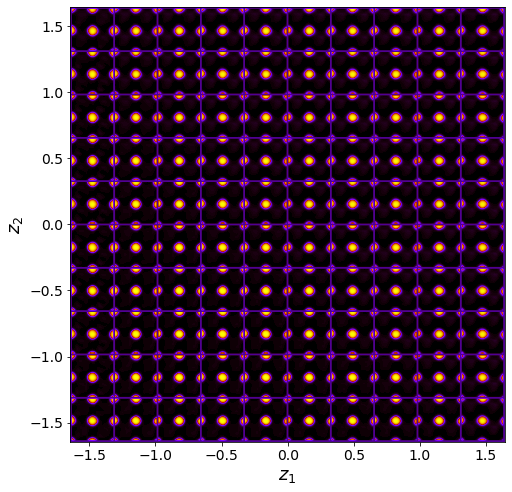

In [ ]:
sh_vae.manifold2d(d=10, pad_value=.1);

Encode and plot the latent space representations:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, '$z_2$')

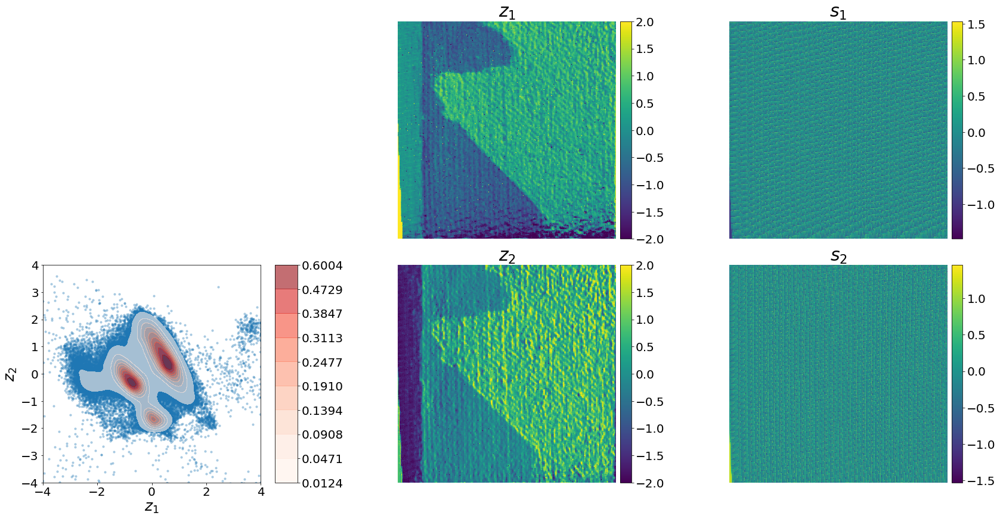

In [ ]:
z_mean, z_sd = sh_vae.encode(train_data)

fig = plt.figure(constrained_layout=True, figsize=(25, 12))
gs = fig.add_gridspec(2, 3, wspace=0.8)

ax1 = fig.add_subplot(gs[1, 0])
ax1.scatter(z_mean[:, -2], z_mean[:, -1], s=10, alpha=.3)
ax1 = sns.kdeplot(z_mean[:, -2], z_mean[:, -1], cmap="Reds", shade=True, shade_lowest=False, cut = 0, alpha = 0.6, cbar = True)
ax1.set_aspect('equal', 'box')
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_xlabel('$z_1$')
ax1.set_ylabel('$z_2$')


ax2 = fig.add_subplot(gs[0, 2])
z_img = z_mean[:, 0].reshape(d1,d2)
z = ax2.imshow(z_img, vmin=z_img.min()/1.00005, vmax=z_img.max()/1.00005)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.1)
cbar2 = fig.colorbar(z, cax=cax2)
ax2.axis('off')
ax2.set_title('$s_1$')

ax3 = fig.add_subplot(gs[1, 2])
z_img = z_mean[:, 1].reshape(d1,d2)
z = ax3.imshow(z_img, vmin=z_img.min()/1.00005, vmax=z_img.max()/1.00005)
divider = make_axes_locatable(ax3)
cax3 = divider.append_axes("right", size="5%", pad=0.1)
cbar3 = fig.colorbar(z, cax=cax3)
ax3.axis('off')
ax3.set_title('$s_2$')

ax4 = fig.add_subplot(gs[0, 1])
z_img = z_mean[:, 2].reshape(d1,d2)
z = ax4.imshow(z_img, vmin=-2, vmax=2)
divider = make_axes_locatable(ax4)
cax4 = divider.append_axes("right", size="5%", pad=0.1)
cbar4 = fig.colorbar(z, cax=cax4)
ax4.axis('off')
ax4.set_title('$z_1$')

ax5 = fig.add_subplot(gs[1, 1])
z_img = z_mean[:, 3].reshape(d1,d2)
z = ax5.imshow(z_img, vmin=-2, vmax=2)
divider = make_axes_locatable(ax5)
cax5 = divider.append_axes("right", size="5%", pad=0.1)
cbar5 = fig.colorbar(z, cax=cax5)
ax5.axis('off')
ax5.set_title('$z_2$')

### NiO-LSMO

Download and show the image (Fig. 5 (c)):

Downloading...
From: https://drive.google.com/uc?id=1SHi0F_NRbwB-EtZFedl9yyH0oABU55AP
To: /content/AtomicImageSimulator/HAADF-42908.dm3
4.80MB [00:00, 42.3MB/s]
Installing package for reading dm3 files...
(1024, 1024) 0.58376056 0.08034261


/content/AtomicImageSimulator/pydm3reader/dm3_lib/_dm3_lib.py:661: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  ima = numpy.fromstring(rawdata, dtype=np_dt)


(-0.5, 1023.5, -0.5, 1023.5)

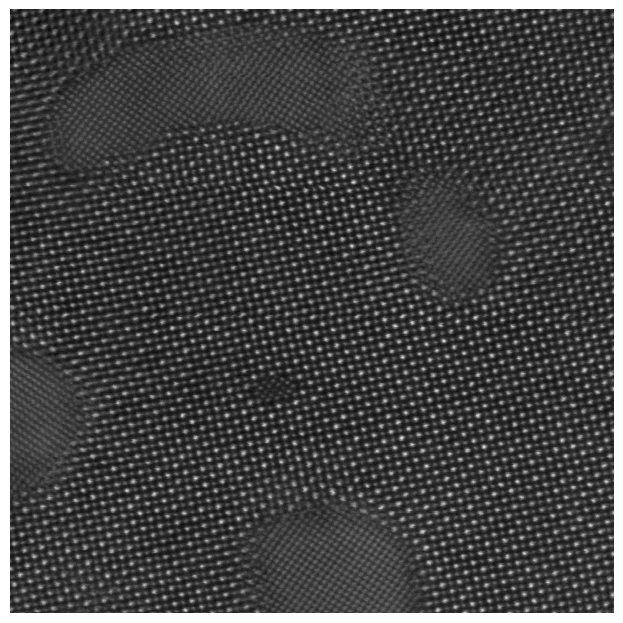

In [ ]:
!gdown https://drive.google.com/uc?id=1SHi0F_NRbwB-EtZFedl9yyH0oABU55AP

# Check and download the dm3 module
dm3r = !python -c "from pydm3reader import dm3_lib as dm3" 2>/dev/null; echo $?
if int(dm3r[0]):
    !echo "Installing package for reading dm3 files..."
    !wget -qq https://bitbucket.org/piraynal/pydm3reader/get/d06ab6b3aa0f.zip
    !unzip d06ab6b3aa0f.zip -d pydm3reader > /dev/null && mv pydm3reader/*/* pydm3reader
    !find ./pydm3reader -type d -empty -delete
    !cd pydm3reader && pip install -q .

from pydm3reader import dm3_lib as dm3

d = dm3.DM3('HAADF-42908.dm3').imagedata # Matt NiO-LSMO sample
print(d.shape, d.max(), d.min())
d = (d-d.min())/(d.max()-d.min())

fig = plt.figure(figsize=(8, 8), dpi=100)
plt.imshow(d, origin='bottom', cmap='gray')
plt.axis('off')

Crop the image into patches:

In [ ]:
window_size = 48
step_size = 8

work_image = d #temp
d1 = int((work_image.shape[0]-window_size/2)/step_size- 2)
d2 = int((work_image.shape[1]-window_size/2)/step_size- 2)
print(d1, d2, d1*d2)

coordinates = aoi.utils.get_coord_grid(work_image, step_size)
imstack_grid, com_grid, frames_grid = aoi.utils.extract_subimages(work_image, coordinates, window_size)

123 123 15129


Initialize data loader:

In [ ]:
imstack_grid = (imstack_grid - imstack_grid.min()) / (imstack_grid.max() - imstack_grid.min())
train_data = torch.tensor(imstack_grid[:,:,:,0]).float()
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), batch_size=64)

#### Train a regular VAE (Fig. 6 (c))

In [ ]:
in_dim = (window_size,window_size)

# Initialize vanilla VAE
vae = pv.models.trVAE(in_dim, latent_dim=2, coord=0, seed=0)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
for e in range(50):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: 1256.6420
Epoch: 2 Training loss: 1224.2283
Epoch: 3 Training loss: 1218.5311
Epoch: 4 Training loss: 1217.4783
Epoch: 5 Training loss: 1215.0179
Epoch: 6 Training loss: 1213.2909
Epoch: 7 Training loss: 1211.9480
Epoch: 8 Training loss: 1210.6250
Epoch: 9 Training loss: 1209.1649
Epoch: 10 Training loss: 1207.7445
Epoch: 11 Training loss: 1206.4441
Epoch: 12 Training loss: 1205.6965
Epoch: 13 Training loss: 1204.6853
Epoch: 14 Training loss: 1203.9231
Epoch: 15 Training loss: 1203.2013
Epoch: 16 Training loss: 1202.4454
Epoch: 17 Training loss: 1201.7827
Epoch: 18 Training loss: 1201.1439
Epoch: 19 Training loss: 1200.5863
Epoch: 20 Training loss: 1200.1037
Epoch: 21 Training loss: 1199.7369
Epoch: 22 Training loss: 1199.1028
Epoch: 23 Training loss: 1198.6868
Epoch: 24 Training loss: 1198.3683
Epoch: 25 Training loss: 1198.1858
Epoch: 26 Training loss: 1198.0288
Epoch: 27 Training loss: 1197.7597
Epoch: 28 Training loss: 1197.2667
Epoch: 29 Training loss: 1197

Plot the learned manifold:


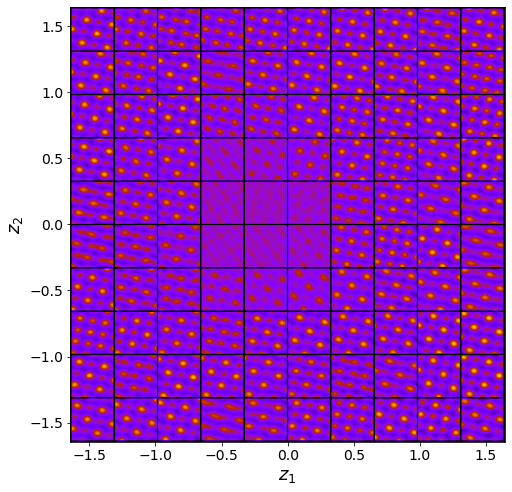

In [ ]:
vae.manifold2d(d=10);

Encode and plot the latent space representations:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, '$z_2$')

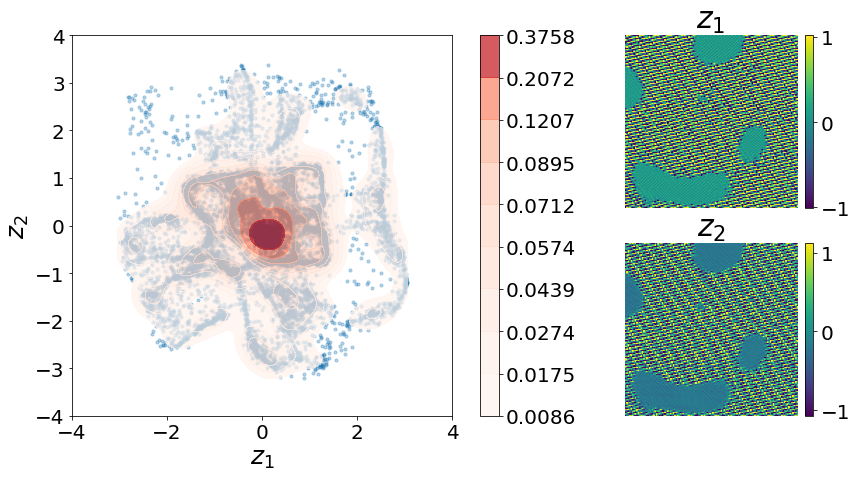

In [ ]:
z_mean, z_sd = vae.encode(train_data)

fig = plt.figure(constrained_layout=False, figsize=(15, 7))
gs = fig.add_gridspec(2, 3, wspace=.1)

ax1 = fig.add_subplot(gs[:, :2])
ax1.scatter(z_mean[:, -2], z_mean[:, -1], s=10, alpha=.3)
ax1 = sns.kdeplot(z_mean[:, -2], z_mean[:, -1], cmap="Reds", shade=True, 
                  shade_lowest=False, cut=0, alpha=.7, cbar=True)
ax1.set_aspect('equal', 'box')
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_xlabel('$z_1$')
ax1.set_ylabel('$z_2$')

ax2 = fig.add_subplot(gs[0, 2])
z1_img = z_mean[:, 0]
z1ax = ax2.imshow(z1_img.reshape(d1,d2), vmin=z1_img.min()/3, vmax=z1_img.max()/3)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.1)
cbar2 = fig.colorbar(z1ax, cax=cax2)
ax2.axis('off')
ax2.set_title('$z_1$')

ax3 = fig.add_subplot(gs[1, 2])
z2_img = z_mean[:, 1]
z2ax = ax3.imshow(z2_img.reshape(d1,d2), vmin=z2_img.min()/3, vmax=z2_img.max()/3)
divider = make_axes_locatable(ax3)
cax3 = divider.append_axes("right", size="5%", pad=0.1)
cbar3 = fig.colorbar(z2ax, cax=cax3)
ax3.axis('off')
ax3.set_title('$z_2$')

#### Train a shift-VAE (Fig. 7 (c))

In [ ]:
in_dim = (window_size,window_size)

# Initialize shift-invariant VAE
sh_vae = pv.models.trVAE(in_dim, latent_dim=2, coord=2, seed=1, dx_prior=0.5, dy_prior=0.5)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(sh_vae)

# Train for n epochs:
kl_scale = torch.linspace(0.05, 1, 50)
for e in range(50):
    sc = kl_scale[e] if e < len(kl_scale) else kl_scale[-1] 
    trainer.step(train_loader, scale_factor=sc)
    trainer.print_statistics()

Epoch: 1 Training loss: 1249.3709
Epoch: 2 Training loss: 1245.4089
Epoch: 3 Training loss: 1245.1294
Epoch: 4 Training loss: 1244.9508
Epoch: 5 Training loss: 1244.9756
Epoch: 6 Training loss: 1244.8420
Epoch: 7 Training loss: 1244.7130
Epoch: 8 Training loss: 1244.5939
Epoch: 9 Training loss: 1244.5119
Epoch: 10 Training loss: 1244.3715
Epoch: 11 Training loss: 1244.3295
Epoch: 12 Training loss: 1244.2702
Epoch: 13 Training loss: 1244.2694
Epoch: 14 Training loss: 1244.3384
Epoch: 15 Training loss: 1244.1339
Epoch: 16 Training loss: 1243.6626
Epoch: 17 Training loss: 1238.4136
Epoch: 18 Training loss: 1225.3788
Epoch: 19 Training loss: 1212.7896
Epoch: 20 Training loss: 1207.8186
Epoch: 21 Training loss: 1205.4578
Epoch: 22 Training loss: 1202.6072
Epoch: 23 Training loss: 1200.0772
Epoch: 24 Training loss: 1197.7391
Epoch: 25 Training loss: 1195.1158
Epoch: 26 Training loss: 1193.1363
Epoch: 27 Training loss: 1191.7515
Epoch: 28 Training loss: 1191.4156
Epoch: 29 Training loss: 1190

Plot the learned manifold:


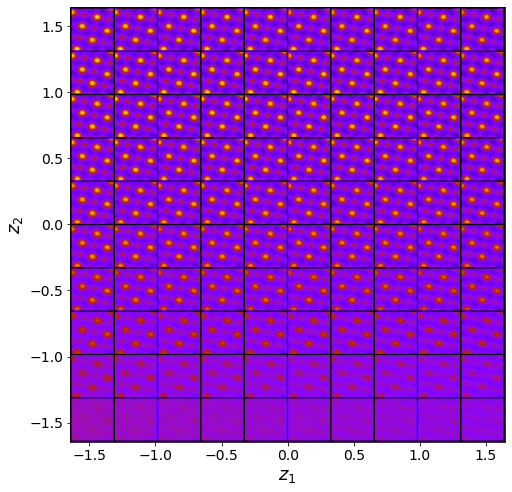

In [ ]:
sh_vae.manifold2d(d=10);

Encode and plot the latent space representations:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, '$z_2$')

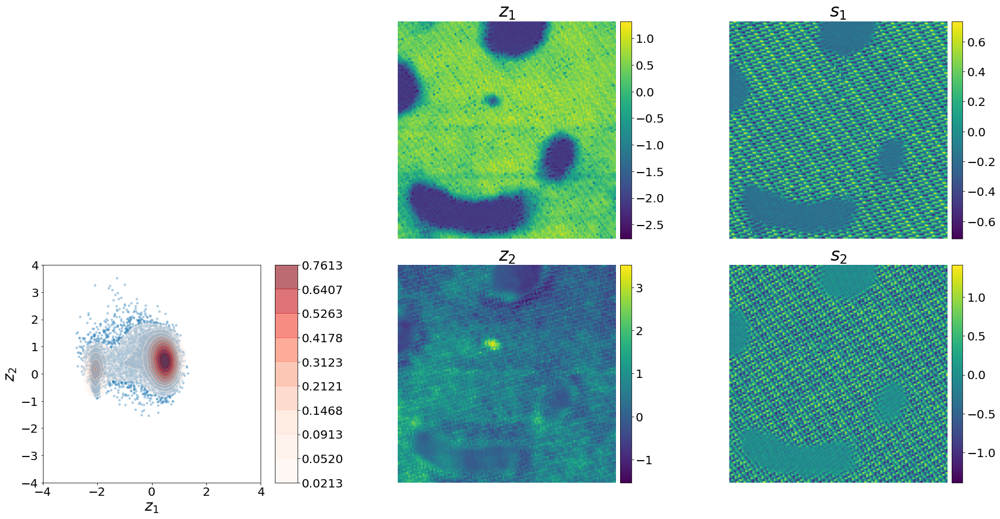

In [ ]:
z_mean, z_sd = sh_vae.encode(train_data)

fig = plt.figure(constrained_layout=True, figsize=(25, 12))
gs = fig.add_gridspec(2, 3, wspace=0.8)

ax1 = fig.add_subplot(gs[1, 0])
ax1.scatter(z_mean[:, -2], z_mean[:, -1], s=10, alpha=.3)
ax1 = sns.kdeplot(z_mean[:, -2], z_mean[:, -1], cmap="Reds", shade=True, shade_lowest=False, cut=0, alpha=0.6, cbar = True)
ax1.set_aspect('equal', 'box')
ax1.set_xlim(-4, 4)
ax1.set_ylim(-4, 4)
ax1.set_xlabel('$z_1$')
ax1.set_ylabel('$z_2$')

ax2 = fig.add_subplot(gs[0, 2])
z_img = z_mean[:, 0].reshape(d1,d2)
z = ax2.imshow(z_img, vmin=z_img.min()/1.00005, vmax=z_img.max()/1.00005)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.1)
cbar2 = fig.colorbar(z, cax=cax2)
ax2.axis('off')
ax2.set_title('$s_1$')

ax3 = fig.add_subplot(gs[1, 2])
z_img = z_mean[:, 1].reshape(d1,d2)
z = ax3.imshow(z_img, vmin=z_img.min()/1.00005, vmax=z_img.max()/1.00005)
divider = make_axes_locatable(ax3)
cax3 = divider.append_axes("right", size="5%", pad=0.1)
cbar3 = fig.colorbar(z, cax=cax3)
ax3.axis('off')
ax3.set_title('$s_2$')

ax4 = fig.add_subplot(gs[0, 1])
z_img = z_mean[:, 2].reshape(d1,d2)
z = ax4.imshow(z_img, vmin=z_img.min()/1.00005, vmax=z_img.max()/1.00005)
divider = make_axes_locatable(ax4)
cax4 = divider.append_axes("right", size="5%", pad=0.1)
cbar4 = fig.colorbar(z, cax=cax4)
ax4.axis('off')
ax4.set_title('$z_1$')

ax5 = fig.add_subplot(gs[1, 1])
z_img = z_mean[:, 3].reshape(d1,d2)
z = ax5.imshow(z_img, vmin=z_img.min()/1.00005, vmax=z_img.max()/1.00005)
divider = make_axes_locatable(ax5)
cax5 = divider.append_axes("right", size="5%", pad=0.1)
cbar5 = fig.colorbar(z, cax=cax5)
ax5.axis('off')
ax5.set_title('$z_2$')

## Grid search for the optimal KL scale factor, $\beta$ (Fig. 8)

Download and show the image (Fig. 5 (c)):

In [ ]:
!gdown https://drive.google.com/uc?id=1SHi0F_NRbwB-EtZFedl9yyH0oABU55AP

# Check and download the dm3 module
dm3r = !python -c "from pydm3reader import dm3_lib as dm3" 2>/dev/null; echo $?
if int(dm3r[0]):
    !echo "Installing package for reading dm3 files..."
    !wget -qq https://bitbucket.org/piraynal/pydm3reader/get/d06ab6b3aa0f.zip
    !unzip d06ab6b3aa0f.zip -d pydm3reader > /dev/null && mv pydm3reader/*/* pydm3reader
    !find ./pydm3reader -type d -empty -delete
    !cd pydm3reader && pip install -q .

from pydm3reader import dm3_lib as dm3

d = dm3.DM3('HAADF-42908.dm3').imagedata # Matt NiO-LSMO sample
print(d.shape, d.max(), d.min())
d = (d-d.min())/(d.max()-d.min())

fig = plt.figure(figsize=(8, 8), dpi=100)
plt.imshow(d, origin='bottom', cmap='gray')
plt.axis('off')

Crop the image into patches:

In [ ]:
window_size = 48
step_size = 8

work_image = d #temp
d1 = int((work_image.shape[0]-window_size/2)/step_size- 2)
d2 = int((work_image.shape[1]-window_size/2)/step_size- 2)
print(d1, d2, d1*d2)

coordinates = aoi.utils.get_coord_grid(work_image, step_size)
imstack_grid, com_grid, frames_grid = aoi.utils.extract_subimages(work_image, coordinates, window_size)

Initialize data loader:

In [ ]:
imstack_grid = (imstack_grid - imstack_grid.min()) / (imstack_grid.max() - imstack_grid.min())
train_data = torch.tensor(imstack_grid[:,:,:,0]).float()
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), batch_size=64)

Define a function for performing the Fourier transform:

In [ ]:
def fourier_cryst(work_image):

  d1, d2 = work_image.shape

  image_FFT = np.array(work_image)
  F = fftpack.fft2(image_FFT)
  F_shift = fftpack.fftshift(F)
  F_shift = np.log(np.abs(F_shift))

  total_int = F_shift.mean()
  lim_kx_min, lim_kx_max = int(d1/2 - 20), int(d1/2 + 20)
  lim_ky_min, lim_ky_max = int(d2/2 - 20), int(d2/2 + 20)
  central_peak_int = F_shift[lim_kx_min : lim_kx_max, lim_ky_min : lim_ky_max].mean()

  return 100*central_peak_int/total_int

Define a function to perform KL scale factor optimization:

In [ ]:
def gpim_function(idx):
    in_dim = (window_size,window_size)
    sh_vae = pv.models.trVAE(in_dim, latent_dim=2, coord=2, seed=1, dx_prior = 0.5, dy_prior = 0.5)
    trainer = pv.trainers.SVItrainer(sh_vae)

    #Defining our optimization space. So they change from 0.1 to 10
    klmin = 10**(idx[0]/20 - 1)
    klmax = 10**(idx[1]/20 - 1)
    kl_scale = torch.linspace(klmin, klmax, 10)

    for e in range(50):
        sc = kl_scale[e] if e < len(kl_scale) else kl_scale[-1] 
        trainer.step(train_loader, scale_factor=sc)
        trainer.print_statistics()

    z_mean, z_sd = sh_vae.encode(train_data)
  
    qual1 = fourier_cryst(z_mean[:, -2].reshape(d1,d2))
    qual2 = fourier_cryst(z_mean[:, -1].reshape(d1,d2))
    
    if qual1 > qual2:
        qual = qual1
        latent_img = z_mean[:, -2].reshape(d1,d2)
    else:
        qual = qual2
        latent_img = z_mean[:, -1].reshape(d1,d2)

    return qual/200, sh_vae, latent_img

Perform the grid search for the optimal KL scale factor:

In [ ]:
s = 32
array = np.zeros((s,s))
for i in range(0,s):
    for j in range(0,s):
        ffft_val, shvae_model, _ = gpim_function([i, j])
        array[i,j] = ffft_val

Plot the grid search heatmap:

In [ ]:
fig, ax0 = plt.subplots(figsize=(7, 7))

c = ax0.pcolormesh(array/200, vmin=.5, vmax=1.75)

divider = make_axes_locatable(ax0)
cax0 = divider.append_axes("right", size="5%", pad=0.15)
fig.colorbar(c, cax=cax0)
cax0.set_ylabel('Intensity')
ax0.set_xlabel('$KL_{min}$')
ax0.set_ylabel('$KL_{max}$')
ax0.set_aspect('equal')
ax0.set_xticks(np.linspace(0, 30, 7)+0.5)
ax0.set_yticks(np.linspace(0, 30, 7)+0.5)
ax0.set_xticklabels(['$10^{-1}$', '$10^{-0.75}$', '$10^{-0.5}$', '$10^{-0.25}$', '$1$', '$10^{0.25}$', '$10^{0.5}$'])
ax0.set_yticklabels(['$10^{-1}$', '$10^{-0.75}$', '$10^{-0.5}$', '$10^{-0.25}$', '$1$', '$10^{0.25}$', '$10^{0.5}$'])

# Add red squares
sq1 = patches.Rectangle((19, 6), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # max
sq2 = patches.Rectangle((18, 23), 1, 1, linewidth=2, edgecolor='r', facecolor='none')   # min
sq3 = patches.Rectangle((5, 26), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # upper left
sq4 = patches.Rectangle((5, 5), 1, 1, linewidth=2, edgecolor='r', facecolor='none') # lower left
sq5 = patches.Rectangle((26, 26), 1, 1, linewidth=2, edgecolor='r', facecolor='none')   # upper right
sq6 = patches.Rectangle((26, 5), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # lower right
sq7 = patches.Rectangle((16, 16), 1, 1, linewidth=2, edgecolor='r', facecolor='none')   # centre
sq8 = patches.Rectangle((5, 16), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # centre left
sq9 = patches.Rectangle((16, 5), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # lower centre
sq10 = patches.Rectangle((16, 26), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # upper centre
sq11 = patches.Rectangle((26, 16), 1, 1, linewidth=2, edgecolor='r', facecolor='none')    # centre right

ax0.add_patch(sq1)
ax0.add_patch(sq2)
ax0.add_patch(sq3)
ax0.add_patch(sq4)
ax0.add_patch(sq5)
ax0.add_patch(sq6)
ax0.add_patch(sq7)
ax0.add_patch(sq8)
ax0.add_patch(sq9)
ax0.add_patch(sq10)
ax0.add_patch(sq11)

Latent variables in image space for selected grid points:

In [ ]:
poi = [(19, 6), (18, 23), (5, 26), (5, 5), (26, 26), (26, 5), (16, 16), (5, 16), (16, 5), (16, 26), (26, 16)]
decoded_imgs = []
for p in poi:
    idx = (p[1], p[0])
    qual, _, img = gpim_function(idx)
    decoded_imgs.append(img)
    plt.imshow(img)
    plt.title(f'$z_2$ (Intensity = {qual:.3}) \n x={p[0]}, y={p[1]}')
    plt.xticks([])
    plt.yticks([])
    plt.rcParams["axes.edgecolor"] = "red"
    plt.rcParams["axes.linewidth"]  = 2
    plt.show()